In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as pg
import plotly.express as exp 
from ast import literal_eval

In [2]:
pd.options.display.float_format = '{:.10f}'.format

In [3]:
df = pd.read_csv('D:\\DA-Project\\recommender_system\\Preprocessed_data.csv')

In [4]:
df

,Unnamed: 0,user_id,location,age,isbn,rating,book_title,book_author,year_of_publication,publisher,img_s,img_m,img_l,Summary,Language,Category,city,state,country
0,0,2,"stockton, california, usa",18.0000000000,0195153448,0,Classical Mythology,Mark P. O. Morford,2002.0000000000,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,Provides an introduction to classical myths pl...,en,['Social Science'],stockton,california,usa
1,1,8,"timmins, ontario, canada",34.7438998807,0002005018,5,Clara Callan,Richard Bruce Wright,2001.0000000000,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,"In a small town in Canada, Clara Callan reluct...",en,['Actresses'],timmins,ontario,canada
2,2,11400,"ottawa, ontario, canada",49.0000000000,0002005018,0,Clara Callan,Richard Bruce Wright,2001.0000000000,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,"In a small town in Canada, Clara Callan reluct...",en,['Actresses'],ottawa,ontario,canada
3,3,11676,"n/a, n/a, n/a",34.7438998807,0002005018,8,Clara Callan,Richard Bruce Wright,2001.0000000000,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,"In a small town in Canada, Clara Callan reluct...",en,['Actresses'],NaN,NaN,NaN
4,4,41385,"sudbury, ontario, canada",34.7438998807,0002005018,0,Clara Callan,Richard Bruce Wright,2001.0000000000,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,"In a small town in Canada, Clara Callan reluct...",en,['Actresses'],sudbury,ontario,canada
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1031170,1031170,278851,"dallas, texas, usa",33.0000000000,0743203763,0,As Hogan Said . . . : The 389 Best Things Anyo...,Randy Voorhees,2000.0000000000,Simon & Schuster,http://images.amazon.com/images/P/0743203763.0...,http://images.amazon.com/images/P/0743203763.0...,http://images.amazon.com/images/P/0743203763.0...,Golf lovers will revel in this collection of t...,en,['Humor'],dallas,texas,usa
1031171,1031171,278851,"dallas, texas, usa",33.0000000000,0767907566,5,All Elevations Unknown: An Adventure in the He...,Sam Lightner,2001.0000000000,Broadway Books,http://images.amazon.com/images/P/0767907566.0...,http://images.amazon.com/images/P/0767907566.0...,http://images.amazon.com/images/P/0767907566.0...,A daring twist on the travel-adventure genre t...,en,['Nature'],dallas,texas,usa
1031172,1031172,278851,"dallas, texas, usa",33.0000000000,0884159221,7,Why stop?: A guide to Texas historical roadsid...,Claude Dooley,1985.0000000000,Lone Star Books,http://images.amazon.com/images/P/0884159221.0...,http://images.amazon.com/images/P/0884159221.0...,http://images.amazon.com/images/P/0884159221.0...,9,9,9,dallas,texas,usa
1031173,1031173,278851,"dallas, texas, usa",33.0000000000,0912333022,7,The Are You Being Served? Stories: 'Camping In...,Jeremy Lloyd,1997.0000000000,Kqed Books,http://images.amazon.com/images/P/0912333022.0...,http://images.amazon.com/images/P/0912333022.0...,http://images.amazon.com/images/P/0912333022.0...,These hilarious stories by the creator of publ...,en,['Fiction'],dallas,texas,usa


Exploratory Data Analysis

In [5]:
df.columns

Index(['Unnamed: 0', 'user_id', 'location', 'age', 'isbn', 'rating',
       'book_title', 'book_author', 'year_of_publication', 'publisher',
       'img_s', 'img_m', 'img_l', 'Summary', 'Language', 'Category', 'city',
       'state', 'country'],
      dtype='object')

In [7]:
df.drop(columns='Unnamed: 0', inplace=True)

In [8]:
list(df.columns)

['user_id',
 'location',
 'age',
 'isbn',
 'rating',
 'book_title',
 'book_author',
 'year_of_publication',
 'publisher',
 'img_s',
 'img_m',
 'img_l',
 'Summary',
 'Language',
 'Category',
 'city',
 'state',
 'country']

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1031175 entries, 0 to 1031174
Data columns (total 18 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   user_id              1031175 non-null  int64  
 1   location             1031175 non-null  object 
 2   age                  1031175 non-null  float64
 3   isbn                 1031175 non-null  object 
 4   rating               1031175 non-null  int64  
 5   book_title           1031175 non-null  object 
 6   book_author          1031175 non-null  object 
 7   year_of_publication  1031175 non-null  float64
 8   publisher            1031175 non-null  object 
 9   img_s                1031175 non-null  object 
 10  img_m                1031175 non-null  object 
 11  img_l                1031175 non-null  object 
 12  Summary              1031175 non-null  object 
 13  Language             1031175 non-null  object 
 14  Category             1031175 non-null  object 
 15

In [10]:
df.isnull().sum()

user_id                    0
location                   0
age                        0
isbn                       0
rating                     0
book_title                 0
book_author                0
year_of_publication        0
publisher                  0
img_s                      0
img_m                      0
img_l                      0
Summary                    0
Language                   0
Category                   0
city                   14103
state                  22798
country                35374
dtype: int64

In [11]:
df = df.replace(np.nan,'0')

In [12]:
df.isnull().sum()


user_id                0
location               0
age                    0
isbn                   0
rating                 0
book_title             0
book_author            0
year_of_publication    0
publisher              0
img_s                  0
img_m                  0
img_l                  0
Summary                0
Language               0
Category               0
city                   0
state                  0
country                0
dtype: int64

In [13]:
df.duplicated().sum()

0

In [14]:
df.drop(index=df[df['Category']=='9'].index, inplace=True)

In [15]:
df['Category'].explode().value_counts()


['Fiction']                                  385135
['Juvenile Fiction']                          39617
['Biography & Autobiography']                 22390
['Humor']                                      8500
['History']                                    8249
                                              ...  
['Angel (Fictitious character : Whedon)']         1
['Face']                                          1
['Church renewal']                                1
['Supermarkets']                                  1
['Alternative histories']                         1
Name: Category, Length: 6447, dtype: int64

In [16]:
df.Category = df.Category.apply (lambda x : literal_eval(x))
df.Category.explode().value_counts()[:10]

Fiction                      385135
Juvenile Fiction              39617
Biography & Autobiography     22390
Humor                          8500
History                        8249
Religion                       7291
Juvenile Nonfiction            5473
Social Science                 5264
Body, Mind & Spirit            4541
Business & Economics           4527
Name: Category, dtype: int64

<AxesSubplot: >

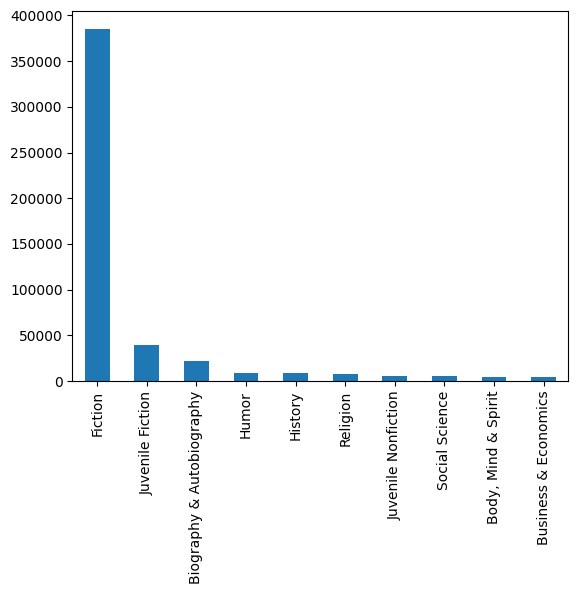

In [17]:
df['Category'].explode().value_counts()[:10].plot.bar()

<AxesSubplot: title={'center': 'Type of book'}, ylabel='Category'>

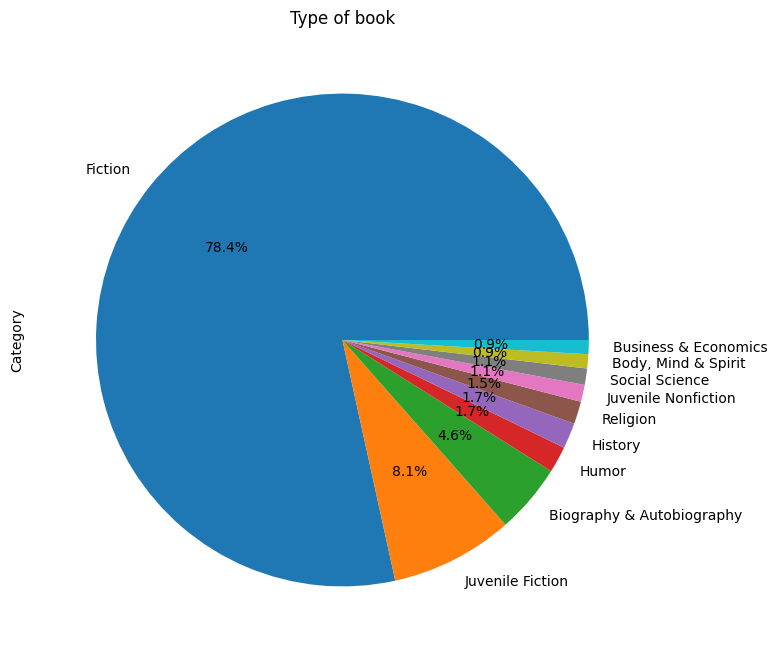

In [23]:
df['Category'].explode().value_counts()[:10].plot(kind='pie', autopct='%1.1f%%', title='Type of book', figsize=(8,8))

In [24]:
df['age'].describe()

count   625073.0000000000
mean        36.4653907892
std         10.3677003319
min          5.0000000000
25%         31.0000000000
50%         34.7438998807
75%         41.0000000000
max         99.0000000000
Name: age, dtype: float64

In [26]:
users_by_age = df.drop(index=df[df['age'] < 11].index, inplace=True)
user_by_age = df.groupby('age')['user_id'].count()
user_by_age = df[df['age'] <= 50]
user_by_age.head()

,user_id,location,age,isbn,rating,book_title,book_author,year_of_publication,publisher,img_s,img_m,img_l,Summary,Language,Category,city,state,country
0,2,"stockton, california, usa",18.0000000000,0195153448,0,Classical Mythology,Mark P. O. Morford,2002.0000000000,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,Provides an introduction to classical myths pl...,en,[Social Science],stockton,california,usa
1,8,"timmins, ontario, canada",34.7438998807,0002005018,5,Clara Callan,Richard Bruce Wright,2001.0000000000,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,"In a small town in Canada, Clara Callan reluct...",en,[Actresses],timmins,ontario,canada
2,11400,"ottawa, ontario, canada",49.0000000000,0002005018,0,Clara Callan,Richard Bruce Wright,2001.0000000000,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,"In a small town in Canada, Clara Callan reluct...",en,[Actresses],ottawa,ontario,canada
3,11676,"n/a, n/a, n/a",34.7438998807,0002005018,8,Clara Callan,Richard Bruce Wright,2001.0000000000,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,"In a small town in Canada, Clara Callan reluct...",en,[Actresses],0,0,0
4,41385,"sudbury, ontario, canada",34.7438998807,0002005018,0,Clara Callan,Richard Bruce Wright,2001.0000000000,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,"In a small town in Canada, Clara Callan reluct...",en,[Actresses],sudbury,ontario,canada


In [27]:
fig = exp.box(user_by_age,y='age',
             title = 'Age Distribution')
fig.show()

In [35]:
by_author = df.groupby('book_author')['isbn'].count().reset_index()
by_author = by_author.sort_values(by='isbn',ascending=False)
by_author.head(10)

,book_author,isbn
54447,Stephen King,5925
43763,Nora Roberts,5697
28883,John Grisham,3919
57611,Tom Clancy,3119
39529,Mary Higgins Clark,3050
12904,Dean R. Koontz,2873
11507,Danielle Steel,2873
55123,Sue Grafton,2585
48410,Rich Shapero,2500
58311,V.C. Andrews,2238


In [42]:
fig = exp.bar(by_author[:10],x='book_author',y='isbn',
              title='The number of rating by Author',
              template='ggplot2',
              )
fig.show()

In [43]:
by_countries = pd.DataFrame(df.groupby('country')['user_id'].count())
by_countries = by_countries.sort_values(by=['user_id'], ascending=False).reset_index()
by_countries.drop(index=by_countries[by_countries['country']=='0'].index,inplace=True)
by_countries.head(10)

,country,user_id
0,usa,470970
1,canada,57298
3,united kingdom,16729
4,australia,10112
5,germany,8344
6,spain,6113
7,portugal,4045
8,malaysia,3272
9,france,3199
10,new zealand,2875


In [55]:
fig = exp.pie(by_countries[:10], names='country',
                            values='user_id')
fig.update_layout(title={'text':'Countries Distribution',
                         'y':0.9,
                         'x':0.5},
                        
                  ) 
fig.show()

In [56]:
df.corr()

C:\Users\84335\AppData\Local\Temp\ipykernel_2724\1134722465.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,user_id,age,rating,year_of_publication
user_id,1.0000000000,-0.0009652861,-0.0419177130,-0.0070512550
age,-0.0009652861,1.0000000000,-0.0213415638,-0.0047132939
rating,-0.0419177130,-0.0213415638,1.0000000000,0.0254672821
year_of_publication,-0.0070512550,-0.0047132939,0.0254672821,1.0000000000


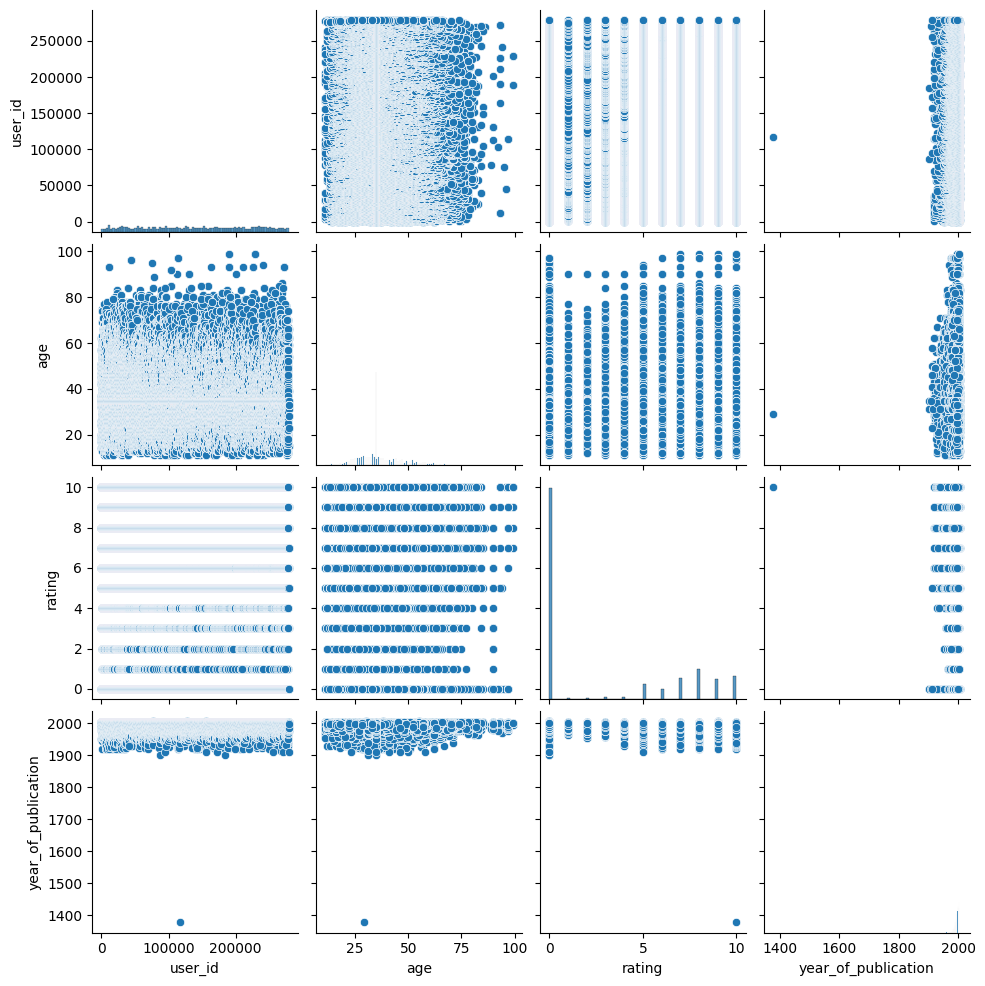

In [57]:
sns.pairplot(df)

Normalizing data(scaling)

In [58]:
from sklearn.preprocessing import StandardScaler

In [59]:
scaled_df = df[['age','rating','year_of_publication']]
x = scaled_df.values[:,1:]
x = np.nan_to_num(x)
scaled_df = StandardScaler().fit_transform(x)
scaled_df

array([[-0.73458103,  0.90997294],
       [ 0.56167701,  0.76201082],
       [-0.73458103,  0.76201082],
       ...,
       [-0.73458103,  0.6140487 ],
       [ 0.56167701,  0.76201082],
       [ 1.08018023,  0.17016233]])

K-means clustering

In [27]:
from sklearn.cluster import KMeans

In [36]:
wcss = []
k = range (1,11)
for i in k:
    kmeans = KMeans(n_clusters = i,init = 'k-means++', random_state = 1)
    kmeans.fit(scaled_df)
    
    wcss.append(kmeans.inertia_)

c:\Users\84335\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\84335\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\84335\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\84335\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warni

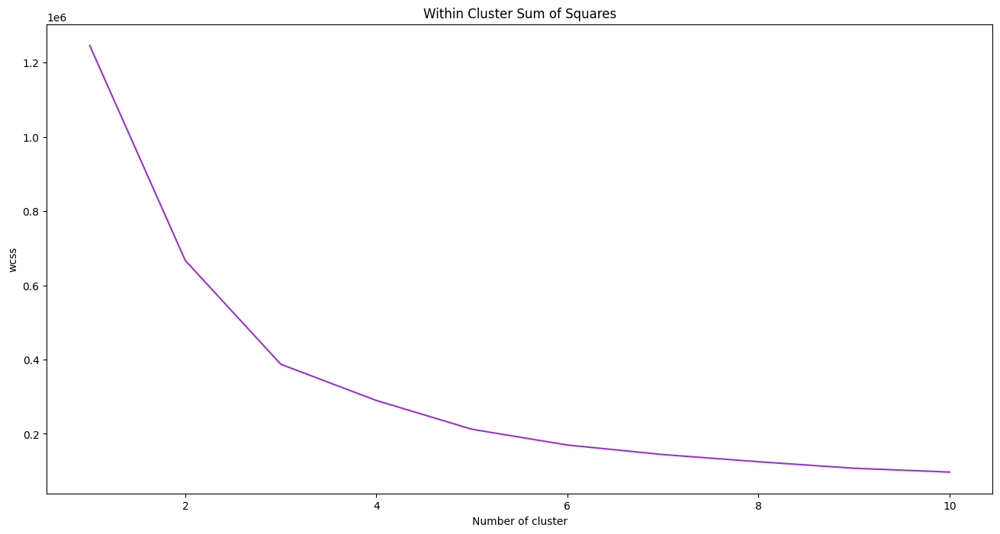

In [43]:
plt.figure(figsize=(16,8))
plt.plot(k, wcss, color = 'darkorchid')
plt.xlabel('Number of cluster')
plt.ylabel('wcss')
plt.title('Within Cluster Sum of Squares')
plt.show()

In [44]:
kmeans = KMeans(n_clusters=3, init = 'k-means++',random_state = 1)
kmeans.fit(x)
y_kmeans = kmeans.predict(x) 

c:\Users\84335\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [45]:
labels = kmeans.labels_
df['group'] = labels
df.head()

,user_id,location,age,isbn,rating,book_title,book_author,year_of_publication,publisher,img_s,img_m,img_l,Summary,Language,Category,city,state,country,group
0,2,"stockton, california, usa",18.0000000000,0195153448,0,Classical Mythology,Mark P. O. Morford,2002.0000000000,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,Provides an introduction to classical myths pl...,en,[Social Science],stockton,california,usa,0
1,8,"timmins, ontario, canada",34.7438998807,0002005018,5,Clara Callan,Richard Bruce Wright,2001.0000000000,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,"In a small town in Canada, Clara Callan reluct...",en,[Actresses],timmins,ontario,canada,1
2,11400,"ottawa, ontario, canada",49.0000000000,0002005018,0,Clara Callan,Richard Bruce Wright,2001.0000000000,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,"In a small town in Canada, Clara Callan reluct...",en,[Actresses],ottawa,ontario,canada,0
3,11676,"n/a, n/a, n/a",34.7438998807,0002005018,8,Clara Callan,Richard Bruce Wright,2001.0000000000,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,"In a small town in Canada, Clara Callan reluct...",en,[Actresses],0,0,0,1
4,41385,"sudbury, ontario, canada",34.7438998807,0002005018,0,Clara Callan,Richard Bruce Wright,2001.0000000000,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,"In a small town in Canada, Clara Callan reluct...",en,[Actresses],sudbury,ontario,canada,0


In [46]:
df.groupby('group').mean()

C:\Users\84335\AppData\Local\Temp\ipykernel_9092\3161626047.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,user_id,age,rating,year_of_publication
group,,,,
0,142794.4774097397,36.5976977526,0.0335104052,1998.3992720969
1,136319.1239229303,36.2775574502,7.7908647445,1998.4212208033
2,141718.1640240970,36.8574357292,2.3818343374,1985.4160151951


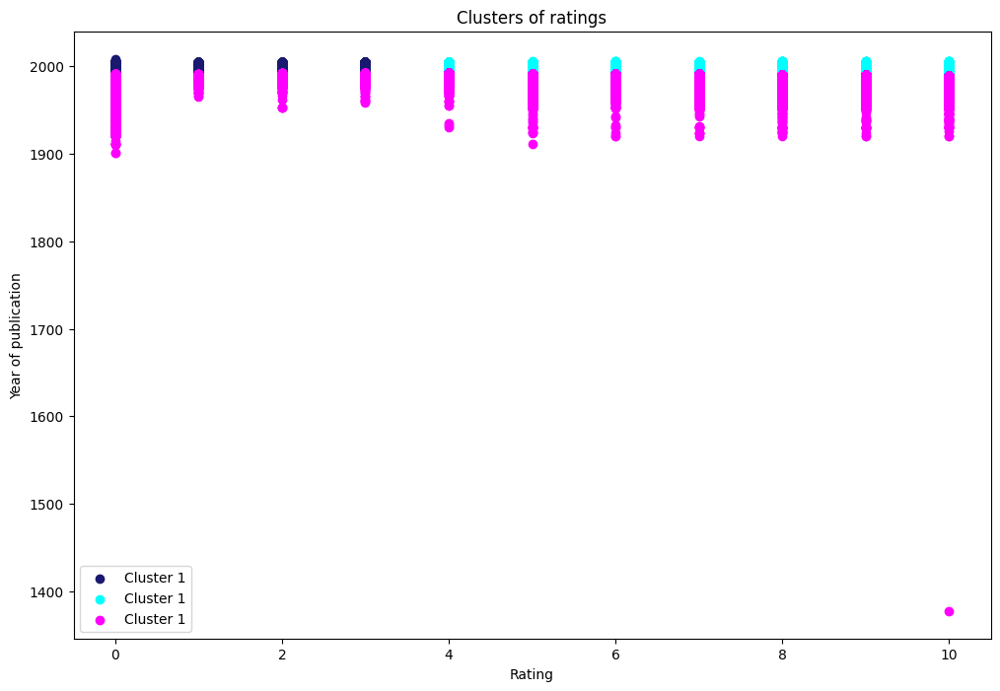

In [51]:
plt.figure(figsize=(12,8))
plt.scatter(x[y_kmeans == 0, 0], x[y_kmeans == 0, 1], c='midnightblue', label= 'Cluster 1')
plt.scatter(x[y_kmeans == 1, 0], x[y_kmeans == 1, 1], c='cyan', label= 'Cluster 1')
plt.scatter(x[y_kmeans == 2, 0], x[y_kmeans == 2, 1], c='magenta', label= 'Cluster 1')
plt.title('Clusters of ratings')
plt.xlabel('Rating')
plt.ylabel('Year of publication')
plt.legend()
plt.show()

Recommendation system

In [60]:
num_rating = df.groupby('book_title')['rating'].count().reset_index()
num_rating

,book_title,rating
0,A Light in the Storm: The Civil War Diary of ...,4
1,"Ask Lily (Young Women of Faith: Lily Series, ...",1
2,Beyond IBM: Leadership Marketing and Finance ...,1
3,Clifford Visita El Hospital (Clifford El Gran...,1
4,Dark Justice,1
...,...,...
128550,"Â¿QuÃ© me quieres, amor?",9
128551,Ã?ngeles fugaces (Falling Angels),5
128552,Ã?Â?ber das Fernsehen.,3
128553,Ã?Â?ber mich selbst. Autobiographische Schriften.,1


In [61]:
avg_rating = df.groupby('book_title')['rating'].mean().reset_index()
avg_rating

,book_title,rating
0,A Light in the Storm: The Civil War Diary of ...,2.2500000000
1,"Ask Lily (Young Women of Faith: Lily Series, ...",8.0000000000
2,Beyond IBM: Leadership Marketing and Finance ...,0.0000000000
3,Clifford Visita El Hospital (Clifford El Gran...,0.0000000000
4,Dark Justice,10.0000000000
...,...,...
128550,"Â¿QuÃ© me quieres, amor?",3.0000000000
128551,Ã?ngeles fugaces (Falling Angels),0.8000000000
128552,Ã?Â?ber das Fernsehen.,2.6666666667
128553,Ã?Â?ber mich selbst. Autobiographische Schriften.,8.0000000000


In [62]:
popular_df = num_rating.merge(avg_rating, on='book_title')
popular_df.rename(columns={'rating_x':'num_rating',
                           'rating_y': 'avg_rating'},inplace=True)
popular_df

,book_title,num_rating,avg_rating
0,A Light in the Storm: The Civil War Diary of ...,4,2.2500000000
1,"Ask Lily (Young Women of Faith: Lily Series, ...",1,8.0000000000
2,Beyond IBM: Leadership Marketing and Finance ...,1,0.0000000000
3,Clifford Visita El Hospital (Clifford El Gran...,1,0.0000000000
4,Dark Justice,1,10.0000000000
...,...,...,...
128550,"Â¿QuÃ© me quieres, amor?",9,3.0000000000
128551,Ã?ngeles fugaces (Falling Angels),5,0.8000000000
128552,Ã?Â?ber das Fernsehen.,3,2.6666666667
128553,Ã?Â?ber mich selbst. Autobiographische Schriften.,1,8.0000000000


In [63]:
popular_df = popular_df[popular_df['num_rating'] > 250]

In [64]:
popular_df = popular_df.merge(df, on='book_title').reset_index()
popular_df = popular_df.drop_duplicates('book_title')[['book_title','book_author','img_s','num_rating','avg_rating']]

In [65]:
popular_df

,book_title,book_author,img_s,num_rating,avg_rating
0,1st to Die: A Novel,James Patterson,http://images.amazon.com/images/P/0446610038.0...,391,3.4987212276
391,A Heartbreaking Work of Staggering Genius,Dave Eggers,http://images.amazon.com/images/P/0375725784.0...,302,3.4238410596
693,A Is for Alibi (Kinsey Millhone Mysteries (Pap...,SUE GRAFTON,http://images.amazon.com/images/P/0553279912.0...,285,2.7333333333
978,A Map of the World,Jane Hamilton,http://images.amazon.com/images/P/0385720106.0...,320,2.4281250000
1298,A Painted House,John Grisham,http://images.amazon.com/images/P/044023722X.0...,652,3.1901840491
...,...,...,...,...,...
36668,We Were the Mulvaneys,Joyce Carol Oates,http://images.amazon.com/images/P/0452282829.0...,341,2.8768328446
37009,When the Wind Blows,James Patterson,http://images.amazon.com/images/P/0446607657.0...,319,2.7304075235
37328,While I Was Gone,Sue Miller,http://images.amazon.com/images/P/0345443284.0...,416,2.5745192308
37744,Wicked: The Life and Times of the Wicked Witch...,Gregory Maguire,http://images.amazon.com/images/P/0060987103.0...,326,3.7668711656


In [66]:
x = df.groupby('user_id')['rating'].count() > 200
ratings_users = x[x].index

In [67]:
filtered_rating = df[df['user_id'].isin(ratings_users)]

In [68]:
y = filtered_rating.groupby('book_title')['rating'].count() >= 50
famous_book = y[y].index

In [69]:
final_rating = filtered_rating[filtered_rating['book_title'].isin(famous_book)]

In [70]:
pt = final_rating.pivot_table(index='book_title',columns='user_id',values='rating')

In [71]:
pt.fillna(0, inplace=True)

In [72]:
pt

user_id,2276,3363,6251,6543,6575,7158,7346,8681,8936,11601,...,269719,270713,271284,273979,274004,274061,274308,275970,277427,278418
book_title,,,,,,,,,,,,,,,,,,,,,
1st to Die: A Novel,0.0000000000,0.0000000000,0.0000000000,9.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
4 Blondes,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
A Case of Need,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,7.0000000000,0.0000000000,0.0000000000,0.0000000000
A Is for Alibi (Kinsey Millhone Mysteries (Paperback)),0.0000000000,0.0000000000,0.0000000000,0.0000000000,7.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
A Map of the World,0.0000000000,0.0000000000,0.0000000000,0.0000000000,7.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Whispers,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
Wicked: The Life and Times of the Wicked Witch of the West,0.0000000000,0.0000000000,0.0000000000,10.0000000000,9.0000000000,0.0000000000,7.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
Wild Animus,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
similarity_score = cosine_similarity(pt)

In [ ]:
similarity_score.shape

(248, 248)

In [ ]:
def recommend(book_name):
    index = np.where(pt.index==book_name)[0][0]
    similar_items = sorted(list(enumerate(similarity_score[index])),key=lambda x:x[1], reverse=True)[1:6]
    
    for i in similar_items:
        print(pt.index[i[0]])

In [ ]:
recommend('Whirlwind (Tyler, Book 1)')

The Bachelor (Warner Books Contemporary Romance)
Heartbreaker
Full Tilt (Janet Evanovich's Full Series)
The Sum of All Fears (Jack Ryan Novels)
Good in Bed
